<a href="https://colab.research.google.com/github/antonellagambarte/vision-por-computadoras-II/blob/main/eda.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [70]:
import gdown
import zipfile
import os
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image, UnidentifiedImageError
import random
import cv2
import numpy as np
import hashlib

### **Carga del dataset**

In [89]:
url = "https://drive.google.com/uc?id=1QQKRENeBHR_Vj6az52N5sOx6ouSNKsuk"
output = "archivo.zip"

gdown.download(url, output, quiet=False, fuzzy=True)

destino = "datos_zip"
os.makedirs(destino, exist_ok=True)
with zipfile.ZipFile(output, 'r') as zip_ref:
    zip_ref.extractall(destino)

print("Archivo extraído correctamente en :", destino)

Downloading...
From (original): https://drive.google.com/uc?id=1QQKRENeBHR_Vj6az52N5sOx6ouSNKsuk
From (redirected): https://drive.google.com/uc?id=1QQKRENeBHR_Vj6az52N5sOx6ouSNKsuk&confirm=t&uuid=2177a4bf-9a4c-4752-9341-4116f89a1619
To: /content/archivo.zip
100%|██████████| 2.19G/2.19G [00:25<00:00, 85.8MB/s]


Archivo extraído correctamente en : datos_zip


Analizando las carpetas del dataset, podemos ver que tienen 3 carpetas: color, grayscale segmeted.

En cada carpeta, están separadas las imagenes en carpetas cuyo nombre se componen de la siguiente manera:

planta__enfermedad/healthy, esto último según se trate de imagenes de plantas sanas o tienen una enfermedad en particular.

In [90]:
data_dir = "datos_zip/plantvillage dataset"

# Existen 3 carpetas en el dataset
tipos = ["color", "grayscale", "segmented"]

all_data = []

for tipo in tipos:
    tipo_dir = os.path.join(data_dir, tipo)
    for label in os.listdir(tipo_dir):
        folder = os.path.join(tipo_dir, label)
        if os.path.isdir(folder):
            for img_name in os.listdir(folder):
                img_path = os.path.join(folder, img_name)
                # Se guarda el tipo (color, segmented,grayscale), el label (ej. Apple_Apple_scab) y el path a la imagen
                all_data.append({"tipo": tipo, "label": label, "path": img_path})


In [91]:
df = pd.DataFrame(all_data)
print(f"Total de imágenes: {len(df)}")
print(f"Número de clases: {df['label'].nunique()}")


Total de imágenes: 162916
Número de clases: 38


In [92]:
df.head()

,tipo,label,path
0,color,Orange___Haunglongbing_(Citrus_greening),datos_zip/plantvillage dataset/color/Orange___...
1,color,Orange___Haunglongbing_(Citrus_greening),datos_zip/plantvillage dataset/color/Orange___...
2,color,Orange___Haunglongbing_(Citrus_greening),datos_zip/plantvillage dataset/color/Orange___...
3,color,Orange___Haunglongbing_(Citrus_greening),datos_zip/plantvillage dataset/color/Orange___...
4,color,Orange___Haunglongbing_(Citrus_greening),datos_zip/plantvillage dataset/color/Orange___...


Cada carpeta existen 38 clases.

In [93]:
df['tipo'].value_counts()

,count
tipo,
segmented,54306
color,54305
grayscale,54305


### **Utils**

In [94]:
def get_color_proportions(image_path):
    """
    Cálcula la proporción de píxeles verdes y amarillos en una imagen.
    """
    try:
        # Cargar imagen
        img = cv2.imread(image_path)
        if img is None:
            # Maneja la falla en la carga de una imagen
            return 0.0, 0.0

        # Cambiar el espacio de color de BGR a HSV
        hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

        # Definimos un rango de amarillo
        # Es subjetivo pero puede refinarse si se encuentra útil la información
        lower_yellow = np.array([20, 100, 100])  # Hue, Saturation, Value
        upper_yellow = np.array([40, 255, 255])

        # Rangos para verde
        lower_green = np.array([40, 40, 40])
        upper_green = np.array([80, 255, 255])

        # Creamos la máscara para los dos colores
        mask_yellow = cv2.inRange(hsv, lower_yellow, upper_yellow)
        mask_green = cv2.inRange(hsv, lower_green, upper_green)

        # Calculo el total de pixeles no-negros
        # obtamos por esta opción porque trabajemos sobre las imagenes segmentadas
        # Un pixel se considera no-negro cuando cuando la suma de los canales BGR no dan 0
        non_black_pixels_mask = (img[:,:,0] != 0) | (img[:,:,1] != 0) | (img[:,:,2] != 0)
        total_non_black_pixels = np.sum(non_black_pixels_mask)

        if total_non_black_pixels == 0:
            return 0.0, 0.0

        # Calculo el número de pixeles de cada color en la región no-negro
        yellow_pixels = np.sum(mask_yellow[non_black_pixels_mask] > 0)
        green_pixels = np.sum(mask_green[non_black_pixels_mask] > 0)

        # Calcúlo la proporción
        yellow_proportion = yellow_pixels / total_non_black_pixels
        green_proportion = green_pixels / total_non_black_pixels

        return yellow_proportion, green_proportion
    except Exception as e:
        print(f"Error procesando la imagen {image_path}: {e}")
        return 0.0, 0.0

In [95]:
def plot_rgb_distribution(image_path, title="Distribución de Canales RGB"):
    """
    Carga una imagen, separa sus canales RGB y genera histogramas para la intensidad de cada canal.

    Args:
        image_path (str): Ruta al archivo de imagen.
        title (str): Título para el gráfico de los histogramas.
    """
    if image_path is None:
        print("No se puede procesar la imagen: la ruta es nula.")
        return

    try:
        img = Image.open(image_path).convert("RGB") # Asegurarse de que la imagen sea RGB
        img_array = np.array(img)

        # Separar canales RGB
        r_channel = img_array[:, :, 0]
        g_channel = img_array[:, :, 1]
        b_channel = img_array[:, :, 2]

        # Crear histogramas
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        fig.suptitle(title, fontsize=16)

        axes[0].hist(r_channel.flatten(), bins=256, color='red', alpha=0.7)
        axes[0].set_title('Canal Rojo')
        axes[0].set_xlabel('Intensidad')
        axes[0].set_ylabel('Frecuencia')

        axes[1].hist(g_channel.flatten(), bins=256, color='green', alpha=0.7)
        axes[1].set_title('Canal Verde')
        axes[1].set_xlabel('Intensidad')
        axes[1].set_ylabel('Frecuencia')

        axes[2].hist(b_channel.flatten(), bins=256, color='blue', alpha=0.7)
        axes[2].set_title('Canal Azul')
        axes[2].set_xlabel('Intensidad')
        axes[2].set_ylabel('Frecuencia')

        plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Ajustar layout para título
        plt.show()

        # Mostrar la imagen
        plt.figure(figsize=(6, 6))
        plt.imshow(img)
        plt.title(f"Imagen de muestra: {image_path.split('/')[-1]}")
        plt.axis('off')
        plt.show()

    except FileNotFoundError:
        print(f"Error: La imagen no se encontró en la ruta: {image_path}")
    except Exception as e:
        print(f"Ocurrió un error al procesar la imagen: {e}")

In [96]:
def plot_green_yellow_distribution(image_path, title="Distribución de Colores Verde y Amarillo"):
    """
    Carga una imagen, identifica píxeles verdes y amarillos y genera histogramas
    que representan su distribución de intensidad.

    Args:
        image_path (str): Ruta al archivo de imagen.
        title (str): Título para el gráfico de los histogramas.
    """
    if image_path is None:
        print("No se puede procesar la imagen: la ruta es nula.")
        return

    try:
        # --- Cargar imagen ---
        img = Image.open(image_path).convert("RGB")
        img_array = np.array(img)

        # Convertir a HSV para detectar mejor colores
        hsv = cv2.cvtColor(img_array, cv2.COLOR_RGB2HSV)

        # --- Definir rangos de color ---
        # Verde (aprox. 35° a 85° en H)
        lower_green = np.array([35, 50, 50])
        upper_green = np.array([85, 255, 255])

        # Amarillo (aprox. 20° a 35° en H)
        lower_yellow = np.array([20, 50, 50])
        upper_yellow = np.array([35, 255, 255])

        # --- Máscaras ---
        mask_green = cv2.inRange(hsv, lower_green, upper_green)
        mask_yellow = cv2.inRange(hsv, lower_yellow, upper_yellow)

        # --- Intensidades ---
        green_intensity = hsv[:, :, 2][mask_green > 0]
        yellow_intensity = hsv[:, :, 2][mask_yellow > 0]

        # --- Plot ---
        fig, axes = plt.subplots(1, 2, figsize=(12, 5))
        fig.suptitle(title, fontsize=16)

        axes[0].hist(green_intensity, bins=50, color='green', alpha=0.7)
        axes[0].set_title('Distribución de Verde')
        axes[0].set_xlabel('Intensidad (V en HSV)')
        axes[0].set_ylabel('Frecuencia')

        axes[1].hist(yellow_intensity, bins=50, color='gold', alpha=0.7)
        axes[1].set_title('Distribución de Amarillo')
        axes[1].set_xlabel('Intensidad (V en HSV)')
        axes[1].set_ylabel('Frecuencia')

        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

        # Mostrar imagen original con los píxeles verdes y amarillos resaltados
        highlighted = img_array.copy()
        highlighted[mask_green > 0] = [0, 255, 0]
        highlighted[mask_yellow > 0] = [255, 255, 0]

        plt.figure(figsize=(6, 6))
        plt.imshow(highlighted)
        plt.title("Verde y Amarillo detectados")
        plt.axis('off')
        plt.show()

    except FileNotFoundError:
        print(f"Error: La imagen no se encontró en la ruta: {image_path}")
    except Exception as e:
        print(f"Ocurrió un error al procesar la imagen: {e}")

In [97]:
def plot_red_brown_distribution(image_path, title="Distribución de Colores Rojo y Marrón"):
    """
    Carga una imagen, identifica píxeles rojos y marrones y genera histogramas
    que representan su distribución de intensidad.

    Args:
        image_path (str): Ruta al archivo de imagen.
        title (str): Título para el gráfico de los histogramas.
    """
    if image_path is None:
        print("No se puede procesar la imagen: la ruta es nula.")
        return

    try:
        # --- Cargar imagen ---
        img = Image.open(image_path).convert("RGB")
        img_array = np.array(img)

        # Convertir a HSV para detectar mejor colores
        hsv = cv2.cvtColor(img_array, cv2.COLOR_RGB2HSV)

        # --- Definir rangos de color ---
        # Rojo: está en los extremos del círculo de tono (H)
        lower_red1 = np.array([0, 80, 50])
        upper_red1 = np.array([10, 255, 255])
        lower_red2 = np.array([170, 80, 50])
        upper_red2 = np.array([180, 255, 255])

        # Marrón: valores entre rojo y naranja, pero con menor brillo (V)
        lower_brown = np.array([10, 80, 20])
        upper_brown = np.array([25, 255, 200])

        # --- Máscaras ---
        mask_red1 = cv2.inRange(hsv, lower_red1, upper_red1)
        mask_red2 = cv2.inRange(hsv, lower_red2, upper_red2)
        mask_red = cv2.bitwise_or(mask_red1, mask_red2)

        mask_brown = cv2.inRange(hsv, lower_brown, upper_brown)

        # --- Intensidades ---
        red_intensity = hsv[:, :, 2][mask_red > 0]
        brown_intensity = hsv[:, :, 2][mask_brown > 0]

        # --- Plot ---
        fig, axes = plt.subplots(1, 2, figsize=(12, 5))
        fig.suptitle(title, fontsize=16)

        axes[0].hist(red_intensity, bins=50, color='red', alpha=0.7)
        axes[0].set_title('Distribución de Rojo')
        axes[0].set_xlabel('Intensidad (V en HSV)')
        axes[0].set_ylabel('Frecuencia')

        axes[1].hist(brown_intensity, bins=50, color='#8B4513', alpha=0.7)
        axes[1].set_title('Distribución de Marrón')
        axes[1].set_xlabel('Intensidad (V en HSV)')
        axes[1].set_ylabel('Frecuencia')

        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

        # --- Imagen resaltada ---
        highlighted = img_array.copy()
        highlighted[mask_red > 0] = [255, 0, 0]       # Rojo brillante
        highlighted[mask_brown > 0] = [139, 69, 19]   # Marrón

        plt.figure(figsize=(6, 6))
        plt.imshow(highlighted)
        plt.title("Rojos y Marrones detectados")
        plt.axis('off')
        plt.show()

    except FileNotFoundError:
        print(f"Error: La imagen no se encontró en la ruta: {image_path}")
    except Exception as e:
        print(f"Ocurrió un error al procesar la imagen: {e}")

In [98]:
def analyze_image_stats(image_path, title="Estadísticas de brillo, contraste y saturación"):
    """
    Calcula brillo medio, contraste (std de intensidad) y saturación media de una imagen.
    Muestra histogramas de distribución de intensidad, saturación y brillo.

    Args:
        image_path (str): Ruta de la imagen.
        title (str): Título para los gráficos.
    """
    if image_path is None:
        print("No se puede procesar la imagen: la ruta es nula.")
        return

    try:
        # Cargar y convertir la imagen
        img = Image.open(image_path).convert("RGB")
        img_array = np.array(img)
        hsv = cv2.cvtColor(img_array, cv2.COLOR_RGB2HSV)

        # Extraer canales HSV
        h, s, v = hsv[:, :, 0], hsv[:, :, 1], hsv[:, :, 2]

        # Calcular estadísticas
        brillo_medio = np.mean(v)
        contraste = np.std(v)
        saturacion_media = np.mean(s)

        print(f"📊 Estadísticas para {image_path.split('/')[-1]}:")
        print(f"→ Brillo medio: {brillo_medio:.2f}")
        print(f"→ Contraste (desvío estándar): {contraste:.2f}")
        print(f"→ Saturación media: {saturacion_media:.2f}")

        # Graficar histogramas
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        fig.suptitle(title, fontsize=16)

        axes[0].hist(v.flatten(), bins=50, color='gray', alpha=0.7)
        axes[0].set_title('Distribución de Brillo (V)')
        axes[0].set_xlabel('Intensidad')
        axes[0].set_ylabel('Frecuencia')

        axes[1].hist(s.flatten(), bins=50, color='orange', alpha=0.7)
        axes[1].set_title('Distribución de Saturación (S)')
        axes[1].set_xlabel('Intensidad')
        axes[1].set_ylabel('Frecuencia')

        axes[2].hist(v.flatten(), bins=50, color='blue', alpha=0.3)
        axes[2].hist(s.flatten(), bins=50, color='red', alpha=0.3)
        axes[2].set_title('Brillo y Saturación superpuestos')
        axes[2].set_xlabel('Intensidad')
        axes[2].set_ylabel('Frecuencia')

        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

        # Mostrar imagen original
        plt.figure(figsize=(5, 5))
        plt.imshow(img)
        plt.title(f"Imagen: {image_path.split('/')[-1]}")
        plt.axis('off')
        plt.show()

    except FileNotFoundError:
        print(f"Error: No se encontró la imagen en la ruta: {image_path}")
    except Exception as e:
        print(f"Ocurrió un error al procesar la imagen: {e}")


### **Revisamos si existen imágenes corruptas**

In [99]:
invalid = 0
for path in df['path']:
    try:
        with Image.open(path) as img:
            img.verify()  # verifica sin cargar toda la imagen
    except (UnidentifiedImageError, FileNotFoundError, OSError):
        invalid += 1

print(f"Imágenes corruptas: {invalid}")

Imágenes corruptas: 0


Separamos por tipo:

In [100]:
df_color = df[df['tipo'] == 'color']
df_gray = df[df['tipo'] == 'grayscale']
df_seg = df[df['tipo'] == 'segmented']

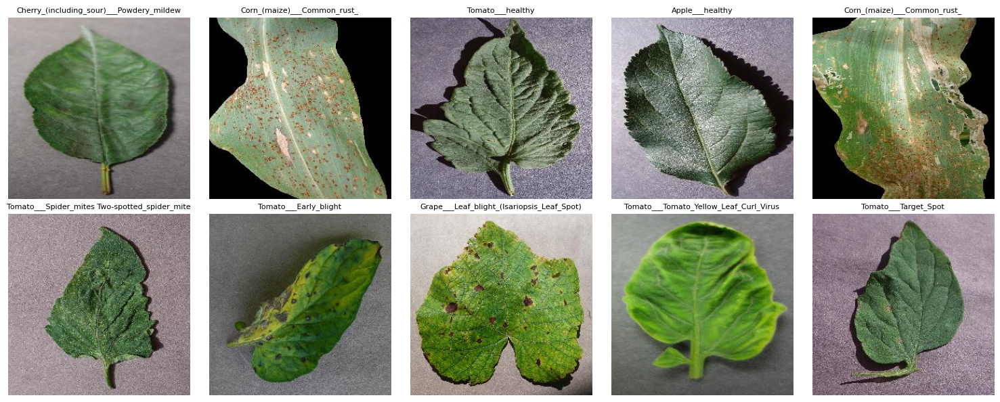

In [101]:
samples_color = df_color.sample(10, random_state=42)
fig, axes = plt.subplots(2, 5, figsize=(15, 6))

for ax, (_, row) in zip(axes.flatten(), samples_color.iterrows()):
    img = Image.open(row['path'])
    ax.imshow(img)
    ax.set_title(row['label'], fontsize=8)
    ax.axis('off')

plt.tight_layout()
plt.show()

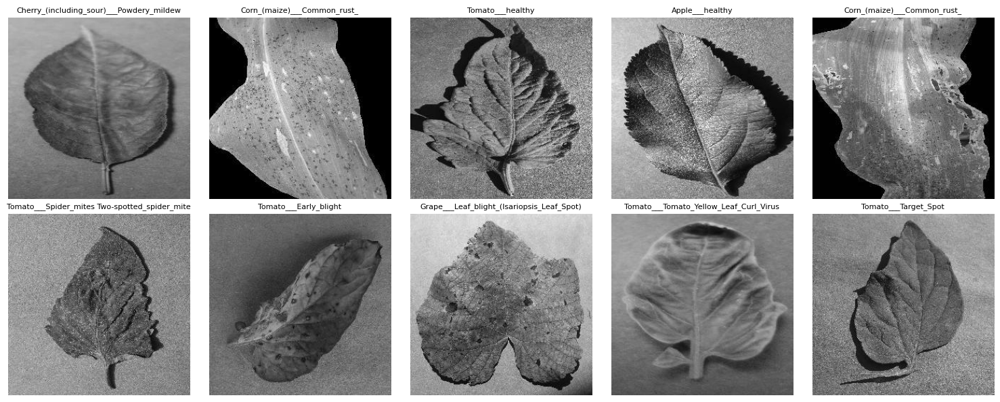

In [102]:
samples_gray = df_gray.sample(10, random_state=42)
fig, axes = plt.subplots(2, 5, figsize=(15, 6))

for ax, (_, row) in zip(axes.flatten(), samples_gray.iterrows()):
    img = Image.open(row['path'])
    ax.imshow(img)
    ax.set_title(row['label'], fontsize=8)
    ax.axis('off')

plt.tight_layout()
plt.show()

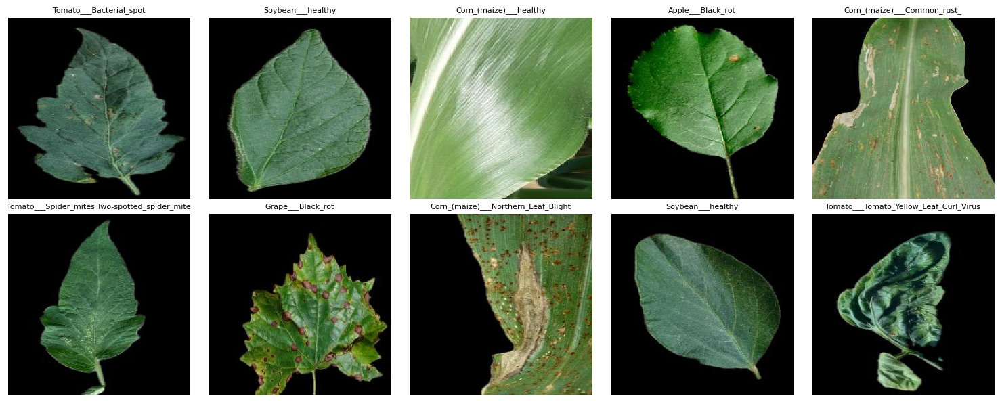

In [103]:
samples_seg = df_seg.sample(10, random_state=42)
fig, axes = plt.subplots(2, 5, figsize=(15, 6))

for ax, (_, row) in zip(axes.flatten(), samples_seg.iterrows()):
    img = Image.open(row['path'])
    ax.imshow(img)
    ax.set_title(row['label'], fontsize=8)
    ax.axis('off')

plt.tight_layout()
plt.show()

Como se pudo observar, en la carpeta color se encuentran las imagenes de las distintas plantas en color. En la carpeta grayscale, estan las mismas imagenes pero en estacala de grises y en la carpeta segmeted, son las mismas pero sin el fondo.

### **Distribución de categorías**

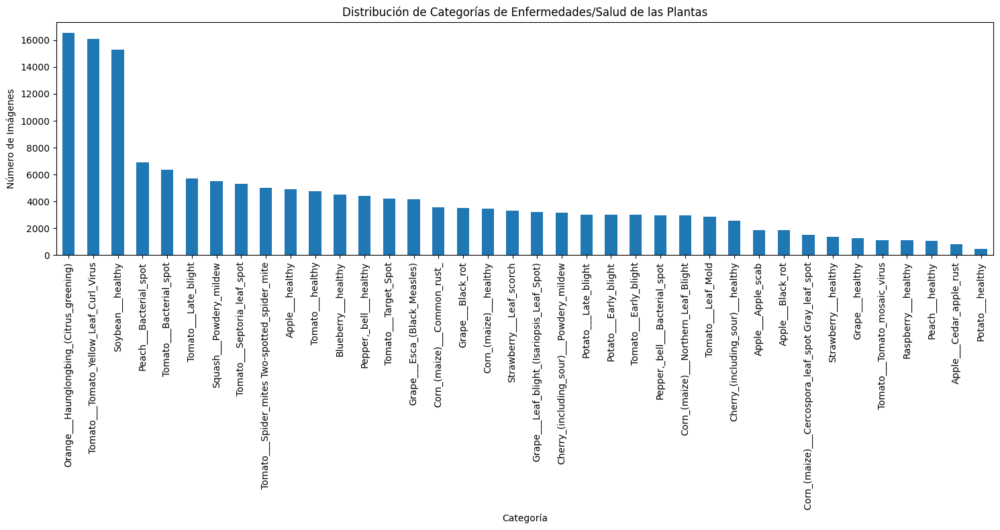

In [104]:
category_counts = df['label'].value_counts()

plt.figure(figsize=(15, 8))
category_counts.plot(kind='bar')
plt.title('Distribución de Categorías de Enfermedades/Salud de las Plantas')
plt.xlabel('Categoría')
plt.ylabel('Número de Imágenes')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

Se puede observar que hay un sesgo hacía las enfermedades con mayor relevancia económica como la infección de cítricos llamada Huanglongbing (HLB) o "Greening" la cual no tiene cura o el "Curl Virus" del tomate. Esta información es importante para evaluar como afecta este desbalance de clases en el entrenamiento del modelo. Como varias enfermedades parecen presentar como síntoma la clorosis (amarillentamiento de la hoja) es sugestivo plantear un gráfico que compare la proporción entre amarillo y verde en cada clase.

### **Distribución del color**

In [105]:
print("Procesando imagenes para extraer proporción de verde y amarillo")

df_seg[['yellow_proportion', 'green_proportion']] = df_seg['path'].apply(lambda x: pd.Series(get_color_proportions(x)))

print("Proporción calculada")
df_seg.head()

Procesando imagenes para extraer proporción de verde y amarillo


/tmp/ipython-input-4168683580.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_seg[['yellow_proportion', 'green_proportion']] = df_seg['path'].apply(lambda x: pd.Series(get_color_proportions(x)))
/tmp/ipython-input-4168683580.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_seg[['yellow_proportion', 'green_proportion']] = df_seg['path'].apply(lambda x: pd.Series(get_color_proportions(x)))


Proporción calculada


,tipo,label,path,yellow_proportion,green_proportion
108610,segmented,Orange___Haunglongbing_(Citrus_greening),datos_zip/plantvillage dataset/segmented/Orang...,0.039468,0.823843
108611,segmented,Orange___Haunglongbing_(Citrus_greening),datos_zip/plantvillage dataset/segmented/Orang...,0.000000,0.864270
108612,segmented,Orange___Haunglongbing_(Citrus_greening),datos_zip/plantvillage dataset/segmented/Orang...,0.000249,0.852197
108613,segmented,Orange___Haunglongbing_(Citrus_greening),datos_zip/plantvillage dataset/segmented/Orang...,0.409876,0.421319
108614,segmented,Orange___Haunglongbing_(Citrus_greening),datos_zip/plantvillage dataset/segmented/Orang...,0.797076,0.080027


<Figure size 1800x900 with 0 Axes>

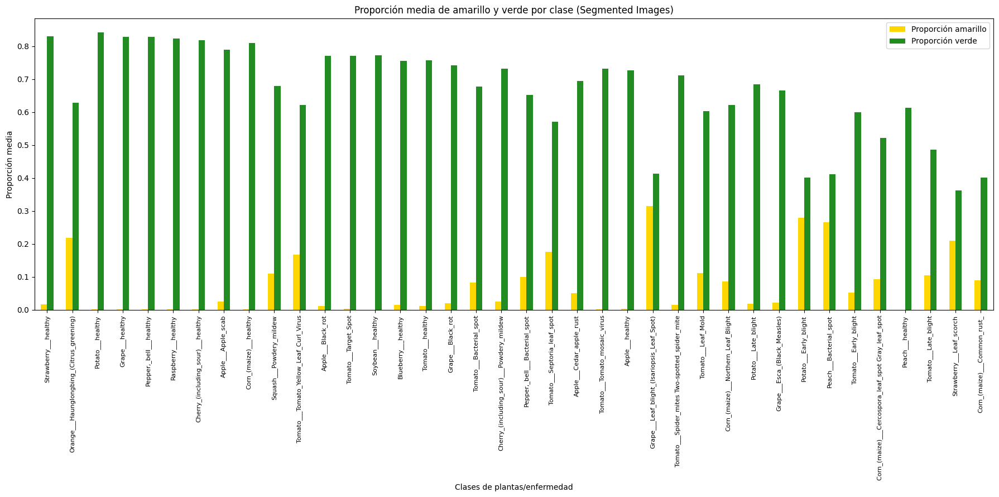

In [106]:
# Agrupamiento por label y cálculo de media por clase
mean_proportions = df_seg.groupby('label')[['yellow_proportion', 'green_proportion']].mean()

# Ordenar por propoción para facilitar la lectura
mean_proportions['total_proportion'] = mean_proportions['yellow_proportion'] + mean_proportions['green_proportion']
mean_proportions = mean_proportions.sort_values(by='total_proportion', ascending=False).drop(columns='total_proportion')

# Crear el gráfico de barras
plt.figure(figsize=(18, 9))
mean_proportions.plot(kind='bar', figsize=(18, 9), color={'yellow_proportion': 'gold', 'green_proportion': 'forestgreen'})
plt.title('Proporción media de amarillo y verde por clase (Segmented Images)')
plt.xlabel('Clases de plantas/enfermedad')
plt.ylabel('Proporción media')
plt.xticks(rotation=90, fontsize=8)
plt.legend(['Proporción amarillo', 'Proporción verde'])
plt.tight_layout()
plt.show()

Se puede apreciar como el el amarillo es caracteristico de algunas enfermedades como "Grape_leaf_blight". Puede ser útil esta información al momento de entrenar el modelo

#### **Visibilizar una muestra**

In [141]:
#Enfermas
df_aux = df_color[df_color['label'] == 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)']
df_aux.reset_index(inplace=True)

image_path_sick = df_aux.iloc[562]['path']
image_label_sick = df_aux.iloc[562]['label']

image_path_sick_stain = df_aux.iloc[973]['path']
image_label_sick_stain = df_aux.iloc[973]['label']

#Sanas
df_aux = df_color[df_color['label'] == 'Grape___healthy']
image_path_healthy = df_aux.iloc[10]['path']
image_label_healthy = df_aux.iloc[10]['label']

Observamos cómo se distribuye el verde y el amarillo en una imagen de muestra con la etiqueta de `Grape___Leaf_blight_(Isariopsis_Leaf_Spot)`. Esta distribucón de color puede ser agregada como feature al modelo.

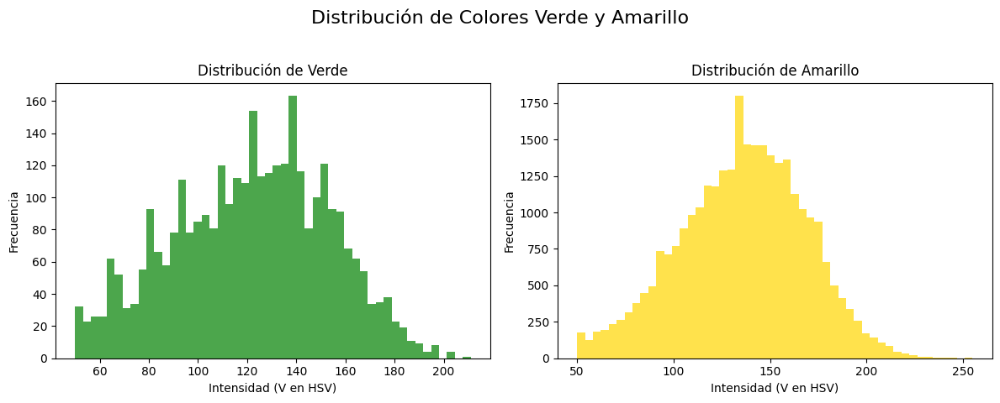

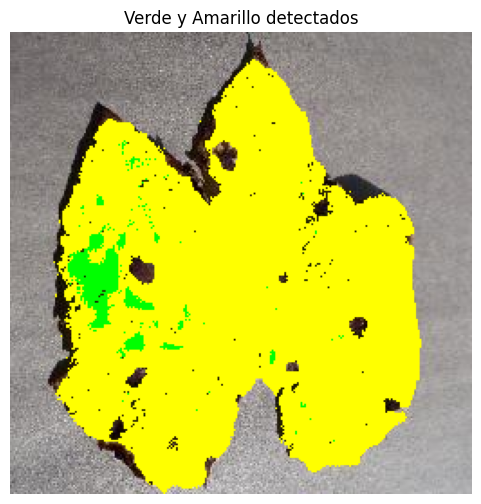

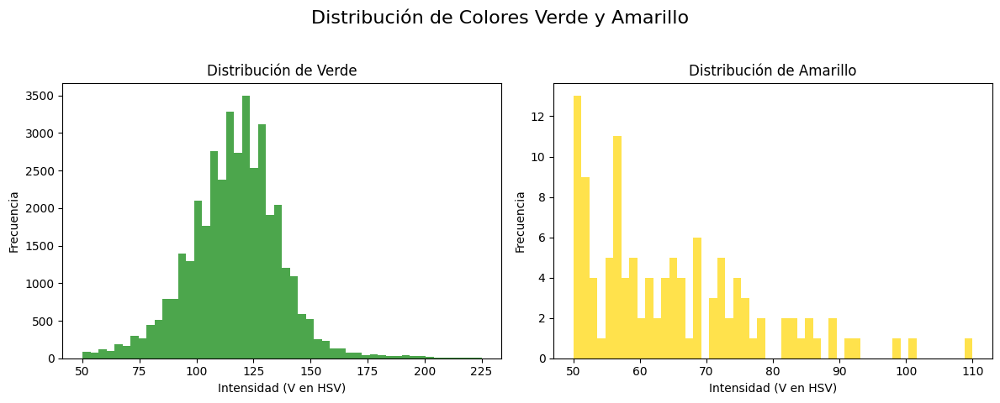

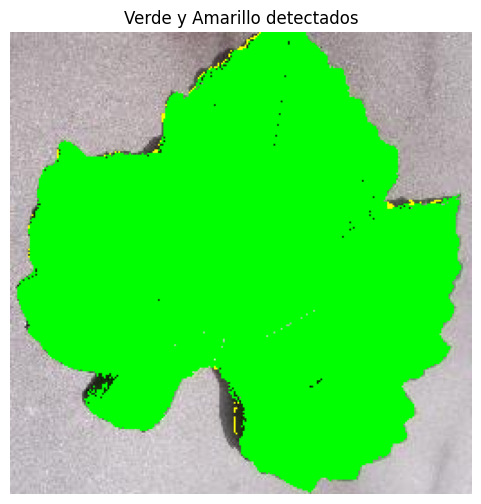

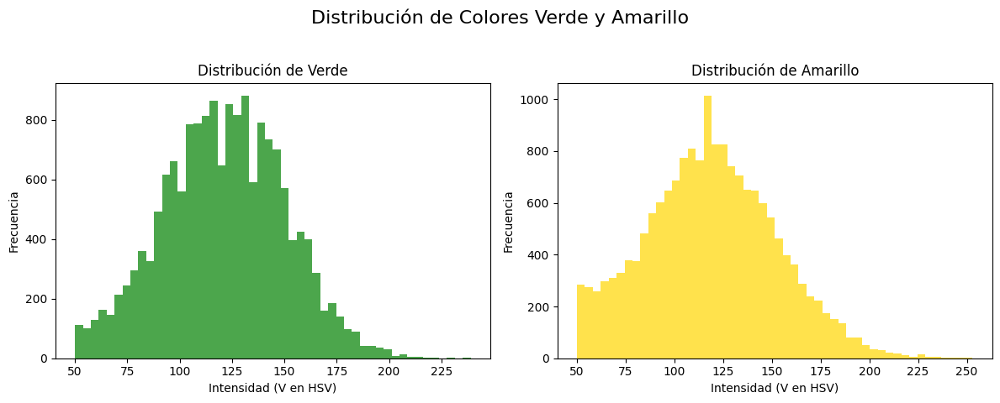

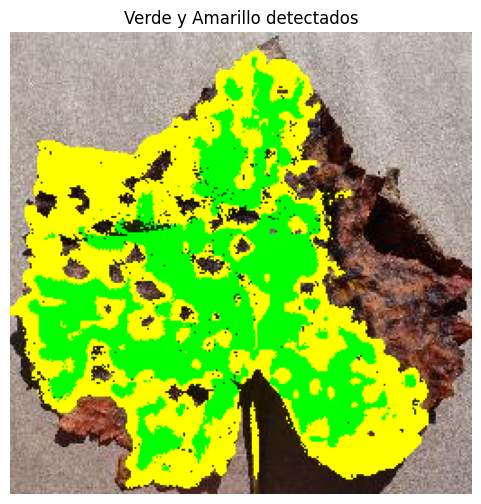

In [142]:
plot_green_yellow_distribution(image_path_sick)
plot_green_yellow_distribution(image_path_healthy)
plot_green_yellow_distribution(image_path_sick_stain)

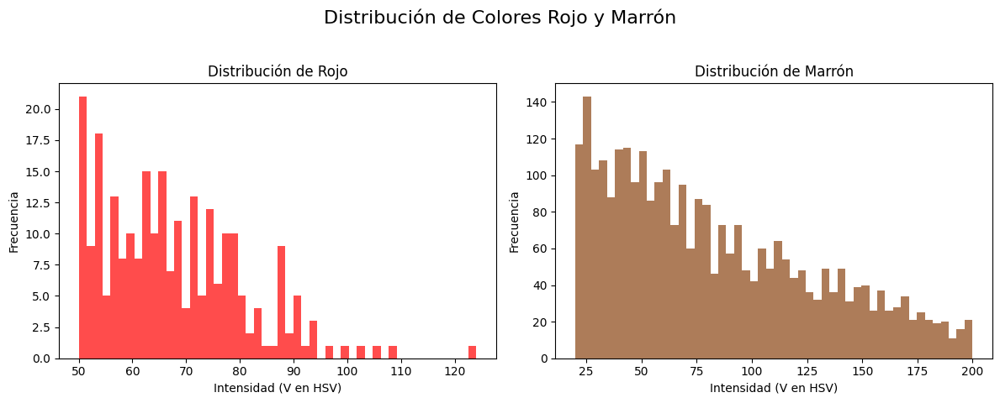

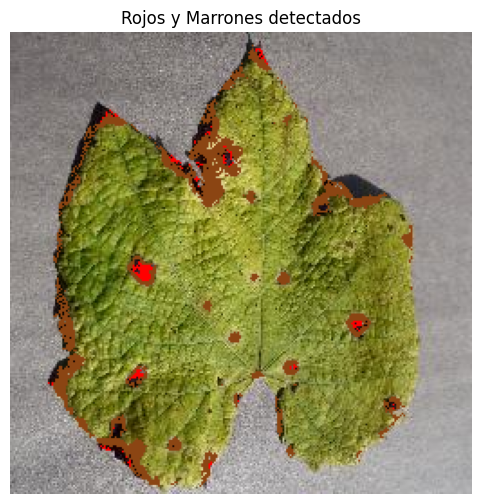

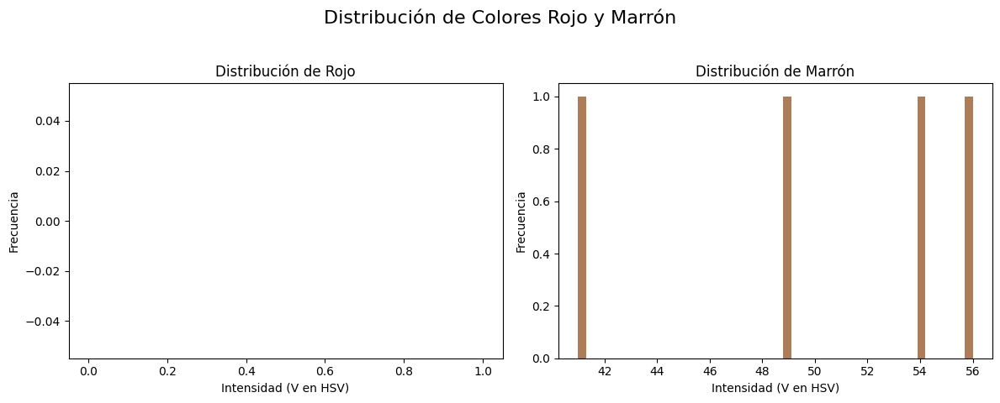

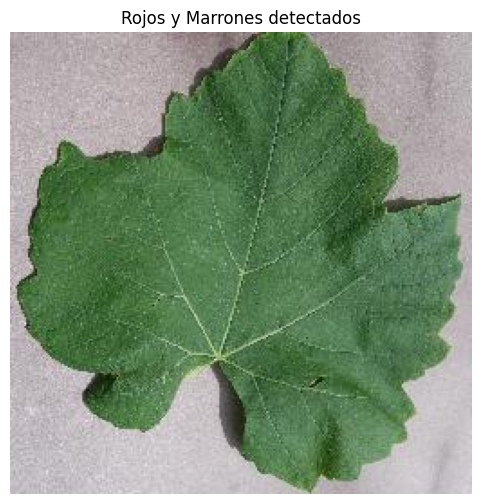

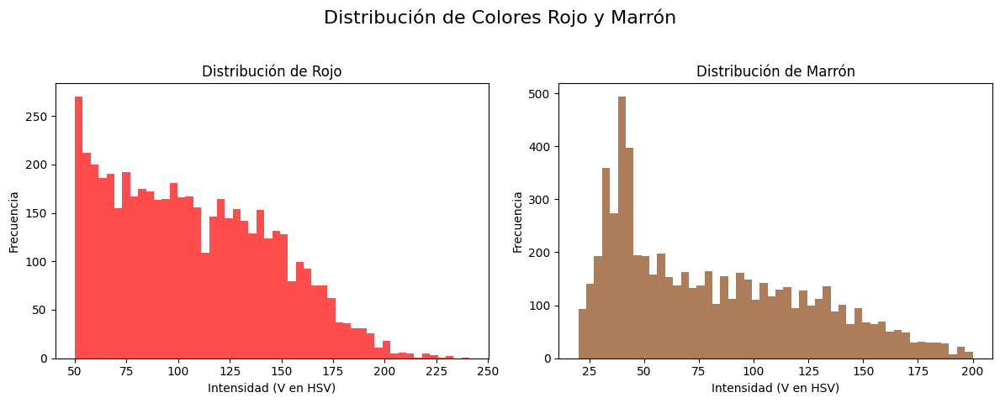

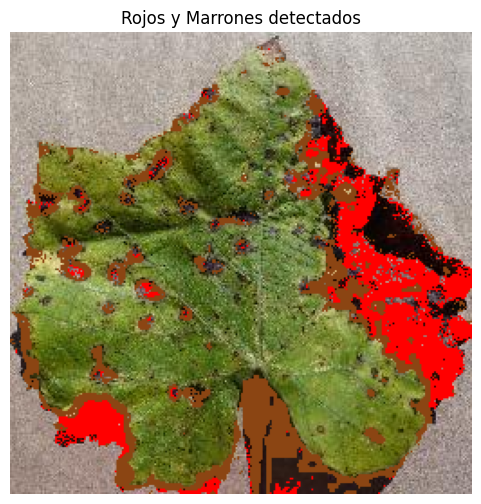

In [143]:
plot_red_brown_distribution(image_path_sick)
plot_red_brown_distribution(image_path_healthy)
plot_red_brown_distribution(image_path_sick_stain)

También de puede agregar la información de distribución RGB para visibilizar la distribución del color cuando hay manchas en las hojas

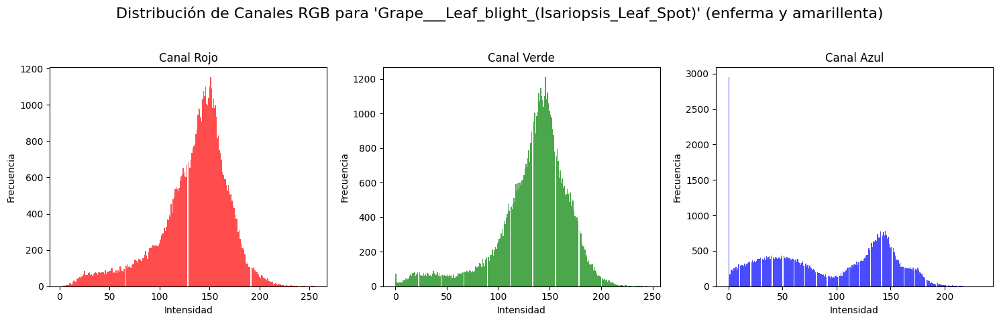

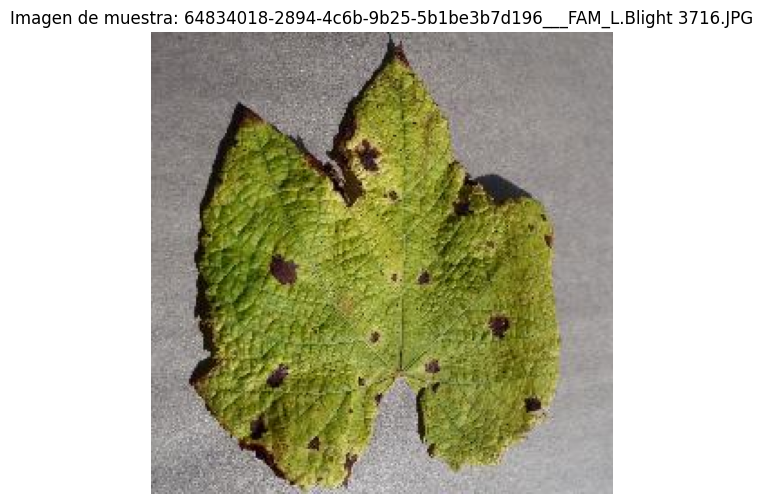

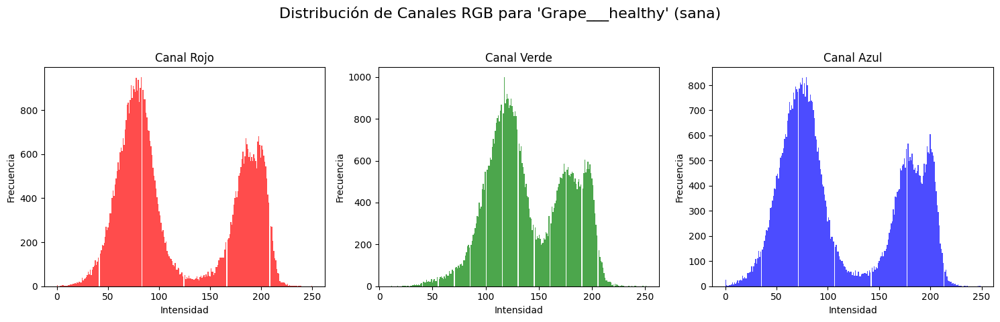

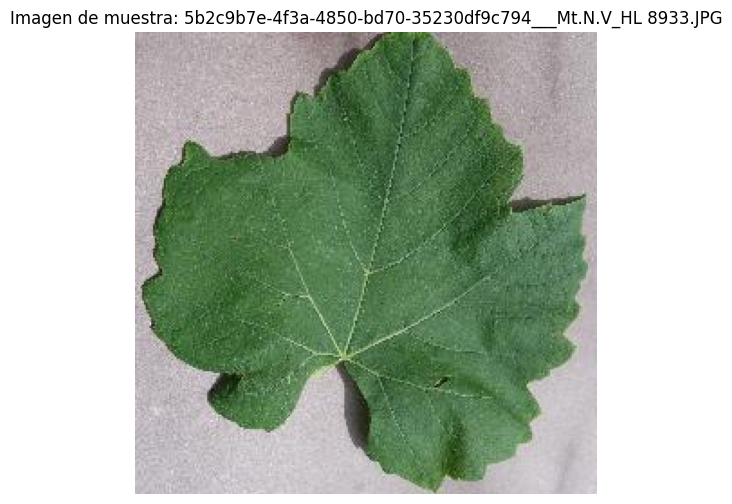

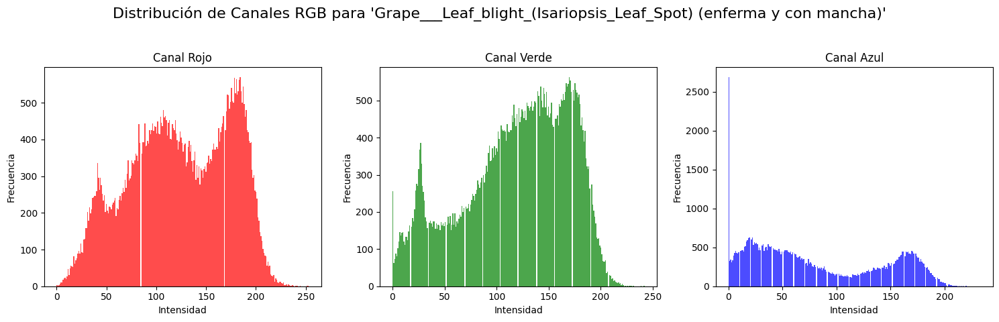

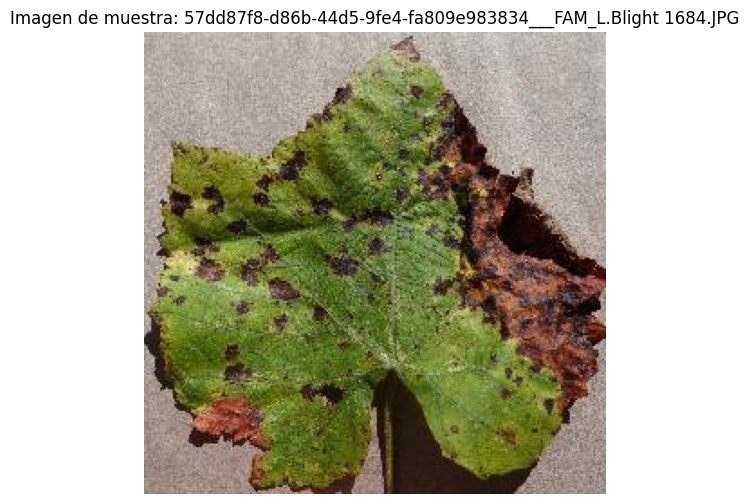

In [144]:
plot_rgb_distribution(image_path_sick, title=f"Distribución de Canales RGB para '{image_label_sick}' (enferma y amarillenta)")
plot_rgb_distribution(image_path_healthy, title=f"Distribución de Canales RGB para '{image_label_healthy}' (sana)")
plot_rgb_distribution(image_path_sick_stain, title=f"Distribución de Canales RGB para '{image_label_sick_stain} (enferma y con mancha)'")

### **Análisis de brillo y saturación**

📊 Estadísticas para 5b2c9b7e-4f3a-4850-bd70-35230df9c794___Mt.N.V_HL 8933.JPG:
→ Brillo medio: 143.40
→ Contraste (desvío estándar): 40.38
→ Saturación media: 65.60


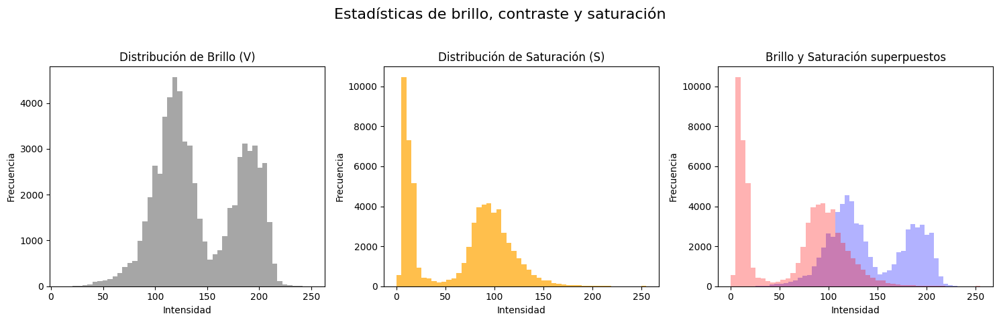

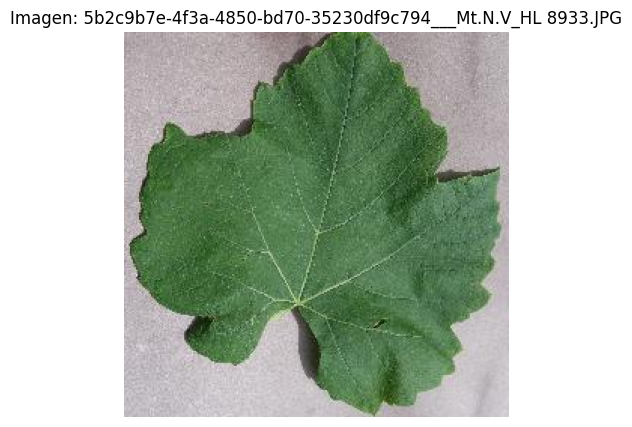

📊 Estadísticas para f436f07c-ff87-4871-b712-5f282912f70c___Mt.N.V_HL 6180.JPG:
→ Brillo medio: 168.55
→ Contraste (desvío estándar): 49.04
→ Saturación media: 52.52


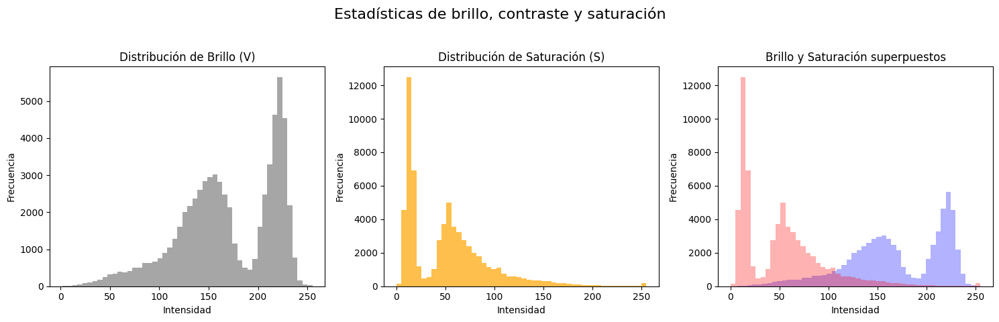

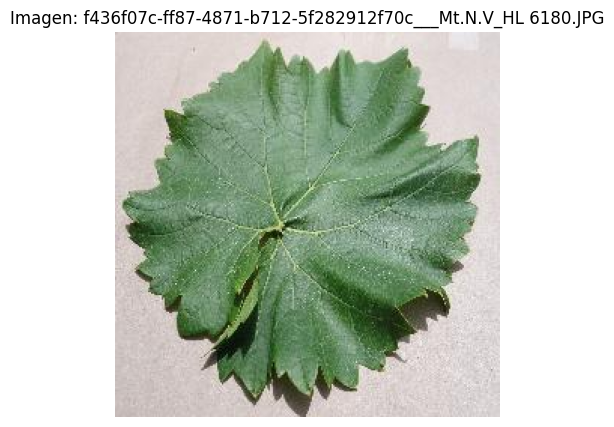

📊 Estadísticas para 64834018-2894-4c6b-9b25-5b1be3b7d196___FAM_L.Blight 3716.JPG:
→ Brillo medio: 137.22
→ Contraste (desvío estándar): 34.76
→ Saturación media: 96.51


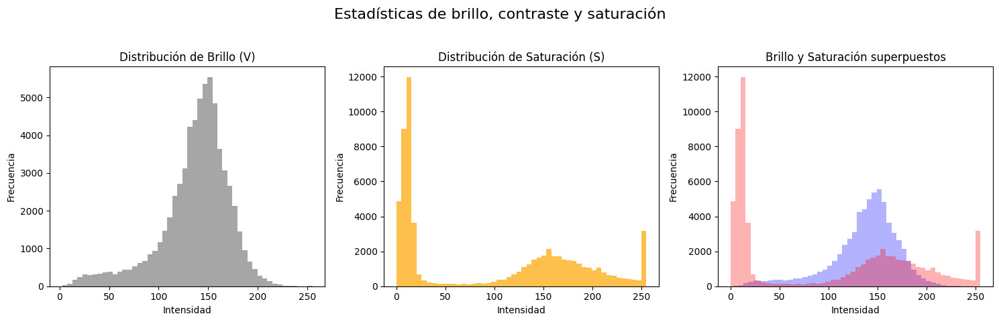

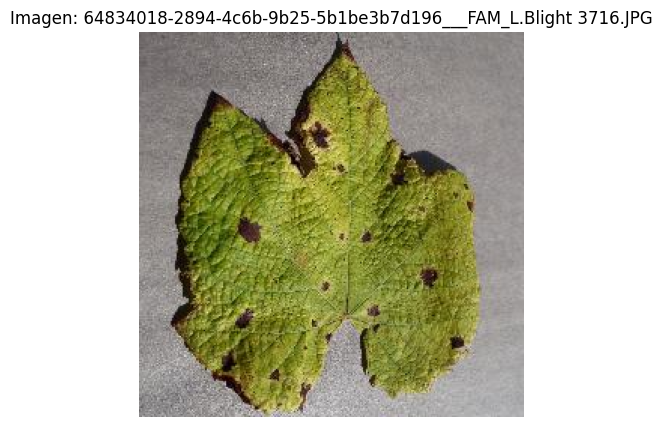

In [161]:
image_path_healthy = df_aux.iloc[10]['path']
image_label_healthy = df_aux.iloc[10]['label']
analyze_image_stats(image_path_healthy)

image_path_healthy = df_aux.iloc[405]['path']
image_label_healthy = df_aux.iloc[405]['label']
analyze_image_stats(image_path_healthy)

analyze_image_stats(image_path_sick)

Existen algunas imágenes de la misma etiqueta que tienen más brillo que otras, esto puede requerir un tratamiento en etapas posteriores.

### **Análisis de tamaños de imágenes**

In [ ]:
# Calculamos tamaño (ancho, alto) por cada imagen
sizes = []
for path in df['path']:
    try:
        with Image.open(path) as img:
            sizes.append(img.size)
    except:
        sizes.append((None, None))  # Por si alguna imagen falla

df_sizes = df.copy()
df_sizes[['width', 'height']] = pd.DataFrame(sizes, index=df_sizes.index)

# Agrupamos por tipo (color/grayscale/segmented) y resolución
res_by_type = (
    df_sizes
    .groupby(['tipo', 'width', 'height'])
    .size()
    .reset_index(name='count')
    .sort_values(['tipo', 'count'], ascending=[True, False])
)


#Resultados
print("Distribución de resoluciones por tipo de imagen:")
print(res_by_type.head(20))


print("\nNúmero de resoluciones distintas por tipo:")
print(res_by_type.groupby('tipo')['count'].count())



Distribución de resoluciones por tipo de imagen:
        tipo  width  height  count
0      color    256     256  54305
1  grayscale    256     256  54305
2  segmented    256     256  54302
3  segmented    324     512      1
4  segmented    335     512      1
5  segmented    466     512      1
6  segmented    470     512      1

Número de resoluciones distintas por tipo:
tipo
color        1
grayscale    1
segmented    5
Name: count, dtype: int64


La mayoría de las imágenes son del mismo tamaño. La que presenta imagenes de un tamaño diferente es la del tipo segmented, pero son solo 5. El resto tienen todas el mismo tamaño: 256x256

### **Análisis de duplicados**

El análisis se hace calculando un hash MD5 para cada imagen. Si las imágenes son idénticas, ambas tendrán el mismo hash.

Hay 63 grupos de duplicados
Número total de imágenes duplicadas: 126

Hash: 02b1fc2fe6b7501ccb5e1f1031341ce9 - 2 imágenes duplicadas idénticas


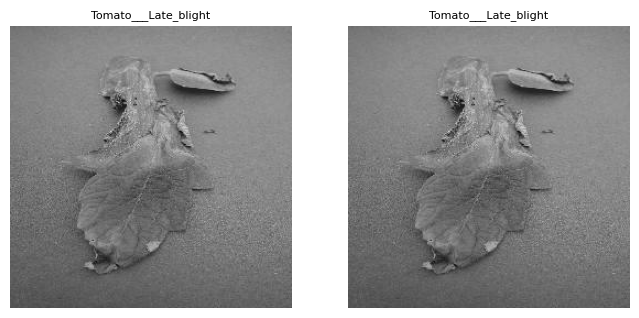


Hash: 0ab46fb1a135f95684c15bf6dbca07c7 - 2 imágenes duplicadas idénticas


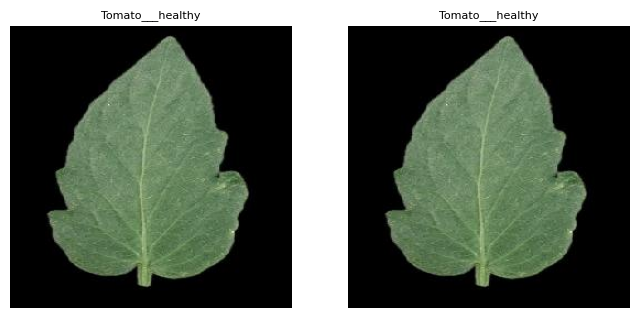


Hash: 0e0dcd876f5b32cac9da836b2e783d91 - 2 imágenes duplicadas idénticas


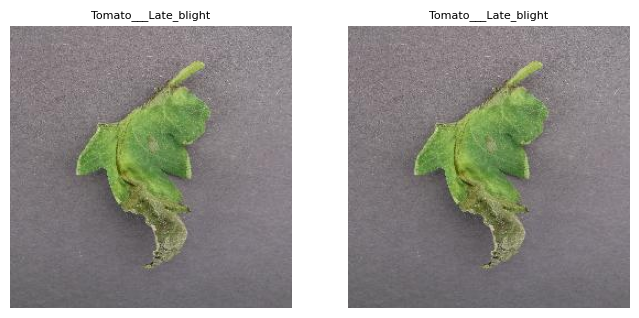


Hash: 161940bd6e73cf648974cc7213cffb8f - 2 imágenes duplicadas idénticas


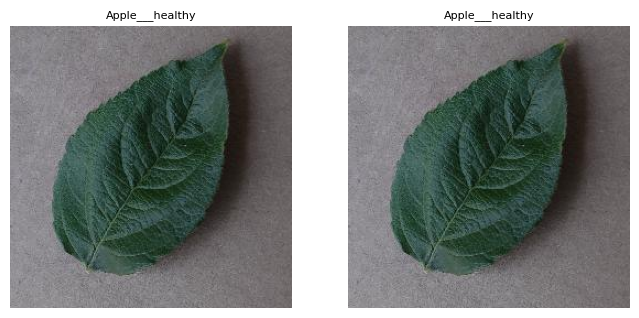


Hash: 1d87a50fa691cef6f476b20bb48cfaf8 - 2 imágenes duplicadas idénticas


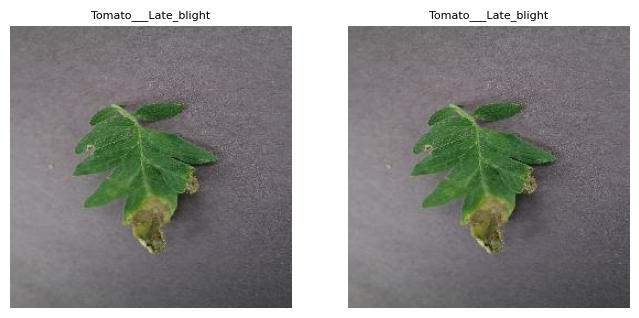


Hash: 1e523c9aa8bd3c509cd02225db589cf2 - 2 imágenes duplicadas idénticas


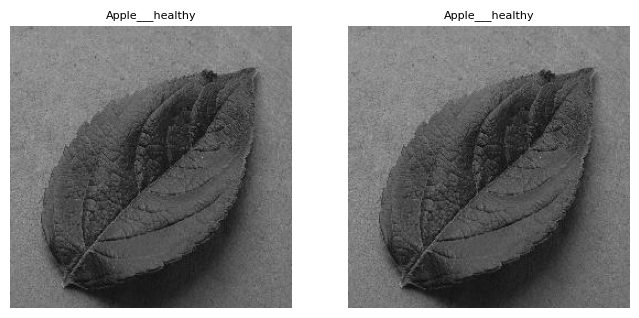


Hash: 29a1c2519b8195fc847e9b576f427cd1 - 2 imágenes duplicadas idénticas


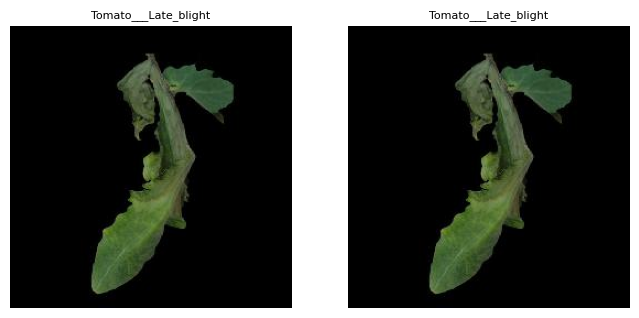


Hash: 2e53ad1ec3f810e2ff4c83400dc69ec9 - 2 imágenes duplicadas idénticas


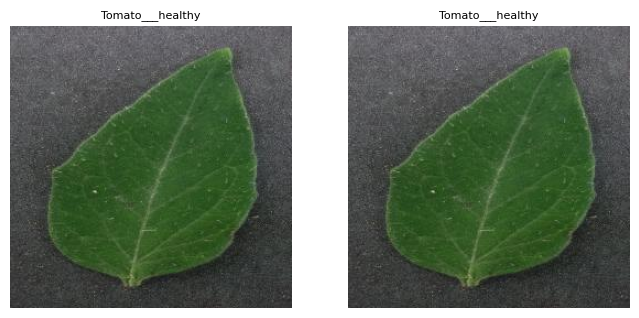


Hash: 2f1283c405a7b06a38ae61593f8299ed - 2 imágenes duplicadas idénticas


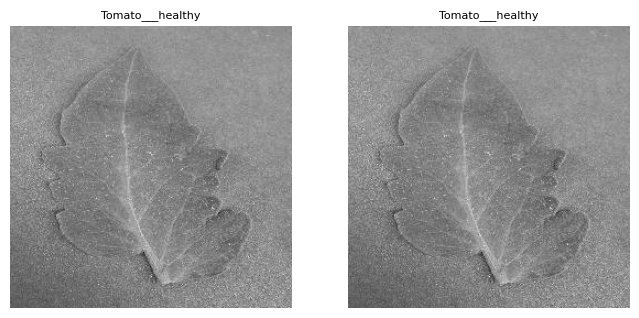


Hash: 32cb22521edc69a5503a6749446dd522 - 2 imágenes duplicadas idénticas


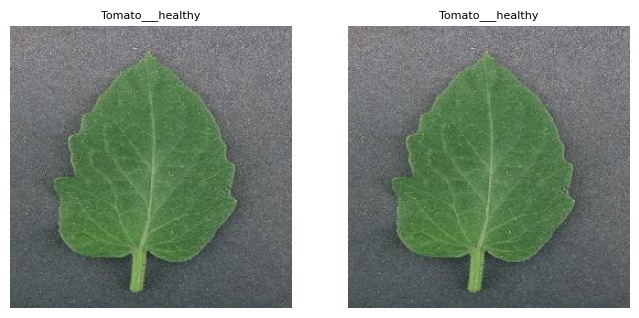


Hash: 33f0712b8992e4d50d5d0d580ed690ef - 2 imágenes duplicadas idénticas


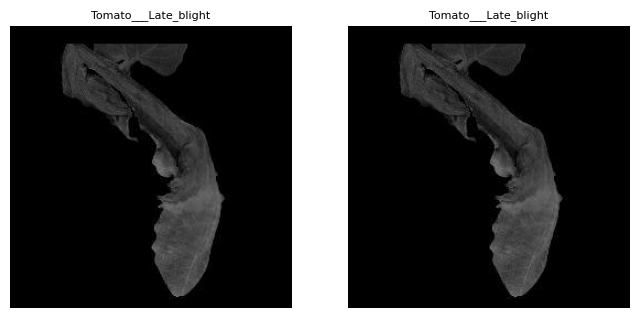


Hash: 3671b9fc09795a9585833c66bb3dc532 - 2 imágenes duplicadas idénticas


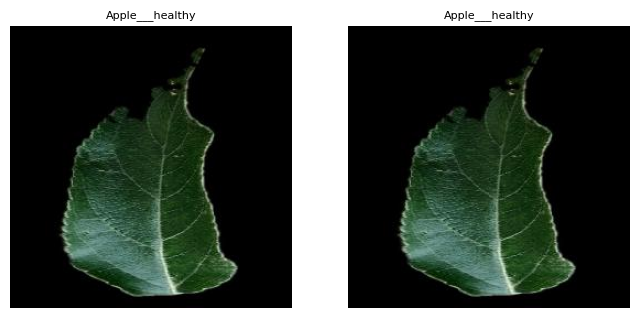


Hash: 3b227920ba50ce0a4602b258f624e935 - 2 imágenes duplicadas idénticas


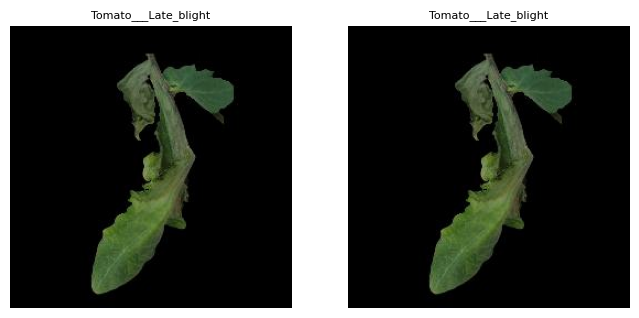


Hash: 3dab5eb1192b5c43fd3015490cf0b18f - 2 imágenes duplicadas idénticas


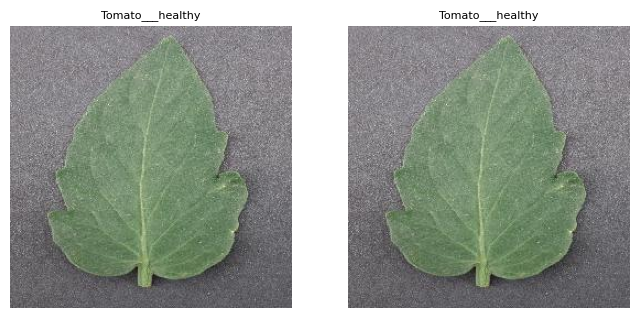


Hash: 41c7e399fc9d0dc5608cbf898901e7a7 - 2 imágenes duplicadas idénticas


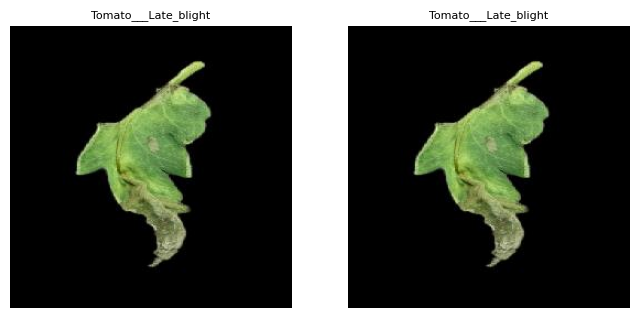


Hash: 467e8bd03d489caa5233087777814a88 - 2 imágenes duplicadas idénticas


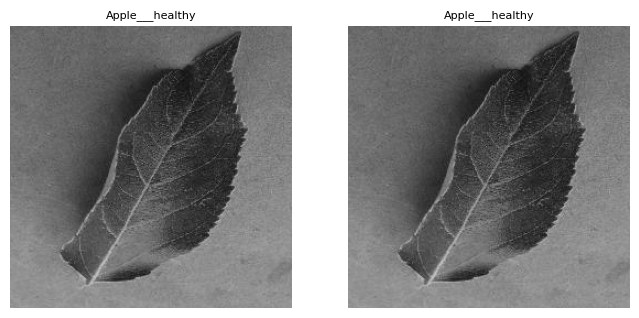


Hash: 46a8232aa6becd2122e834bf50dbcc0e - 2 imágenes duplicadas idénticas


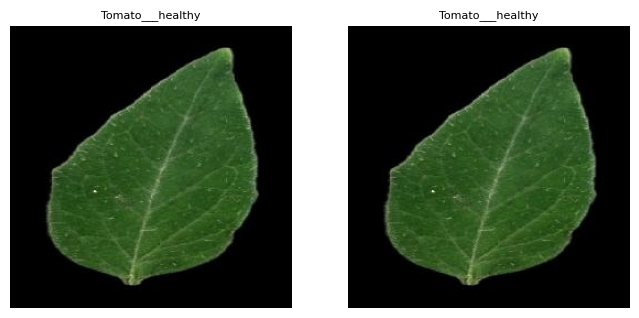


Hash: 48f5d94e58351849b9f219c674323d58 - 2 imágenes duplicadas idénticas


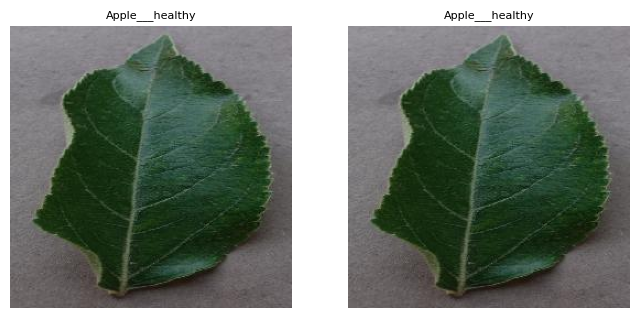


Hash: 4ae12fdd236765b181585d60ec8b76d2 - 2 imágenes duplicadas idénticas


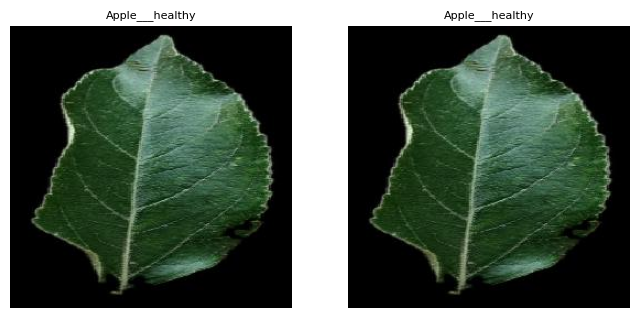


Hash: 4b73700b68ce8704f6b4549a2846dede - 2 imágenes duplicadas idénticas


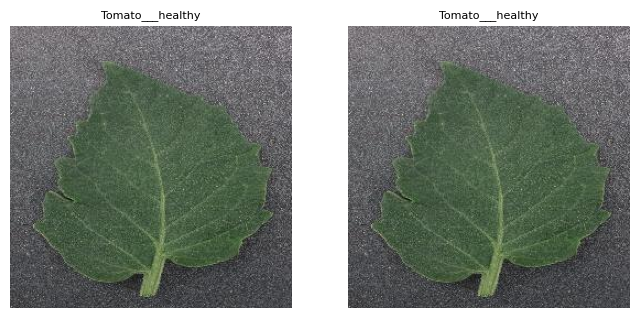


Hash: 4bab4aa40d89e19ed72d8b8d501b1db8 - 2 imágenes duplicadas idénticas


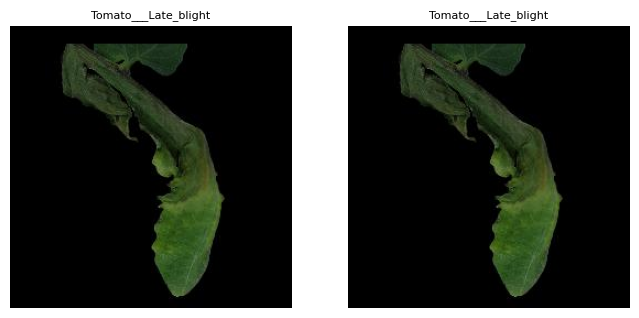


Hash: 4c81589302ebbb46022d447229e9e83a - 2 imágenes duplicadas idénticas


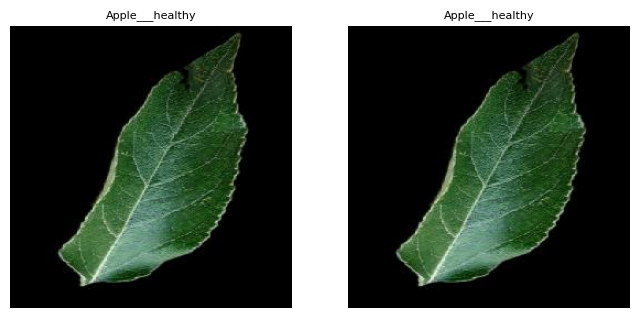


Hash: 4e171c1e7c6c08210932210a2b8d7d35 - 2 imágenes duplicadas idénticas


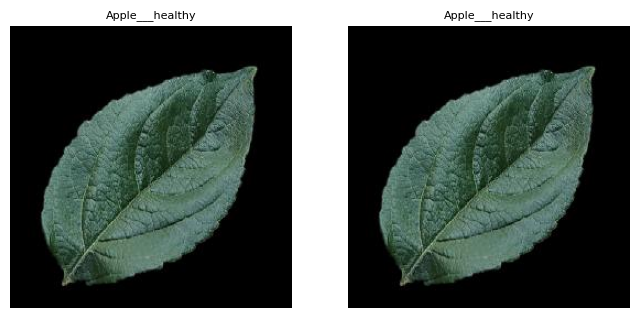


Hash: 573d2918a4d54f4035b50c62786ee090 - 2 imágenes duplicadas idénticas


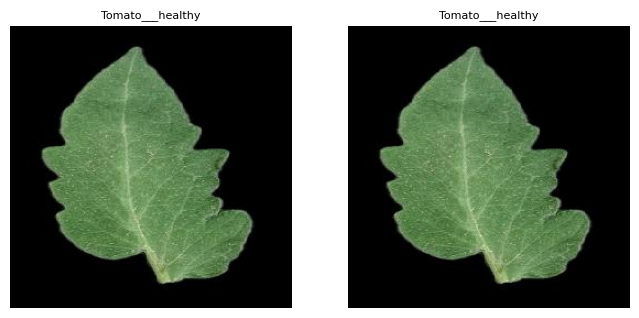


Hash: 5bdbdc7333be3ab35ef81ec17ce14816 - 2 imágenes duplicadas idénticas


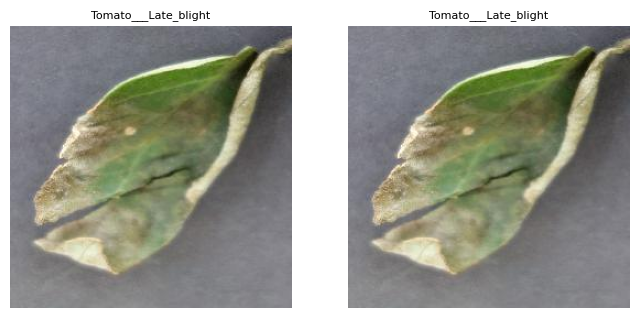


Hash: 61cabcbf7a2412e44ce0bcee3c384a25 - 2 imágenes duplicadas idénticas


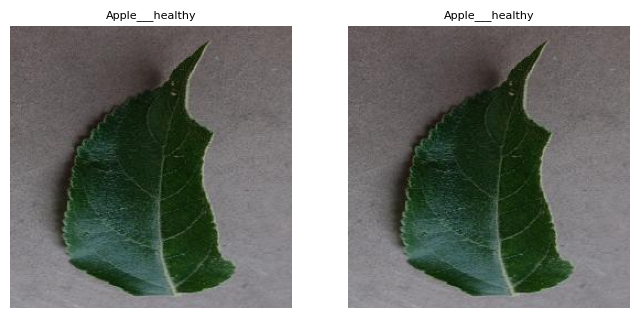


Hash: 68f05a541bf01c0fcfbc7f9445f8a147 - 2 imágenes duplicadas idénticas


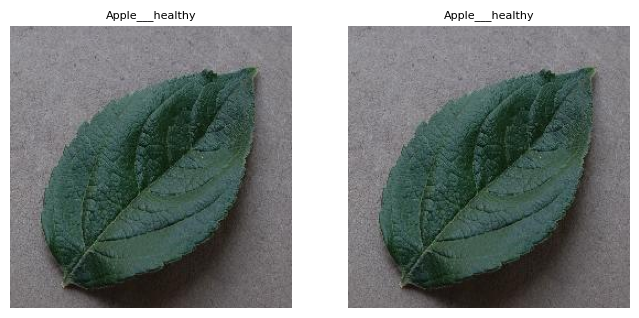


Hash: 6a678b913eba08c164f655f7ebde109e - 2 imágenes duplicadas idénticas


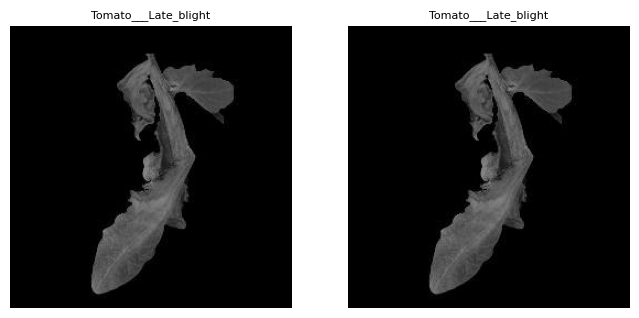


Hash: 6e48e89e89da343b6b90ccda5b18d698 - 2 imágenes duplicadas idénticas


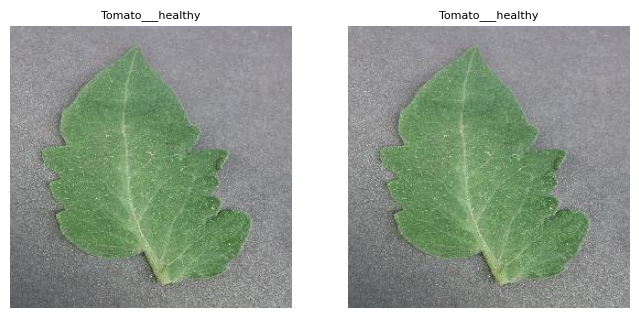


Hash: 710901ff964cf2c13142ad2bf417cb72 - 2 imágenes duplicadas idénticas


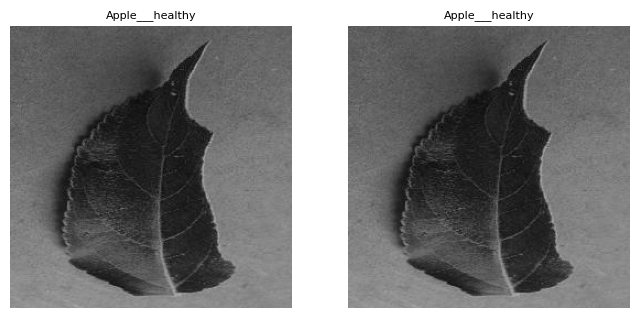


Hash: 73d3c4cc1700edac36fd2fb05ce3aade - 2 imágenes duplicadas idénticas


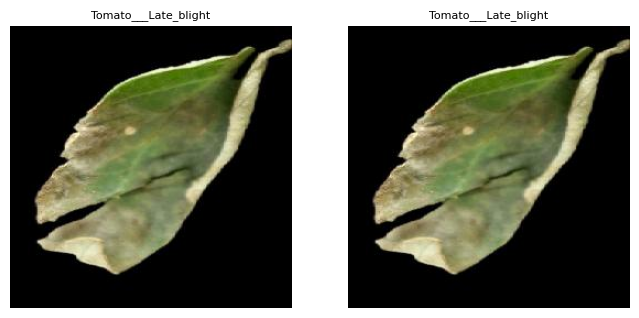


Hash: 77abbebde43bbba34baa8a9e88eb9272 - 2 imágenes duplicadas idénticas


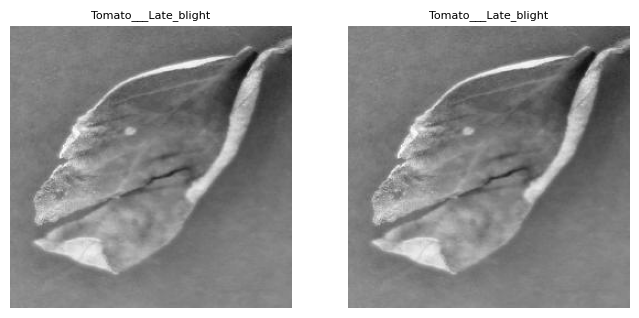


Hash: 77f675d9195b480785589fd8c04527bb - 2 imágenes duplicadas idénticas


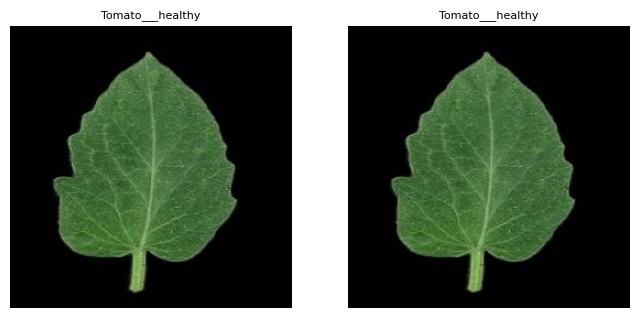


Hash: 7b8d1a208ba97dc73df387fe1f5ddf45 - 2 imágenes duplicadas idénticas


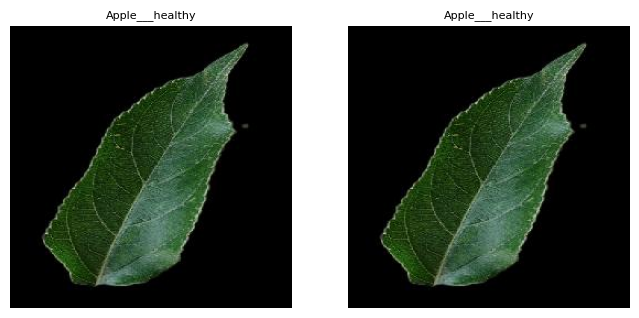


Hash: 7d3f103ddf10d6282bd1fdd2f5a73878 - 2 imágenes duplicadas idénticas


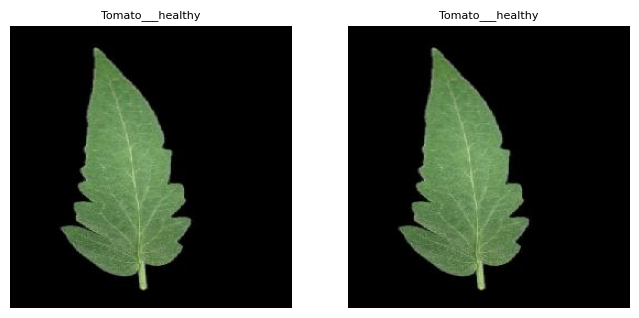


Hash: 80d96c4526e2d5e882fa061d1a5ba902 - 2 imágenes duplicadas idénticas


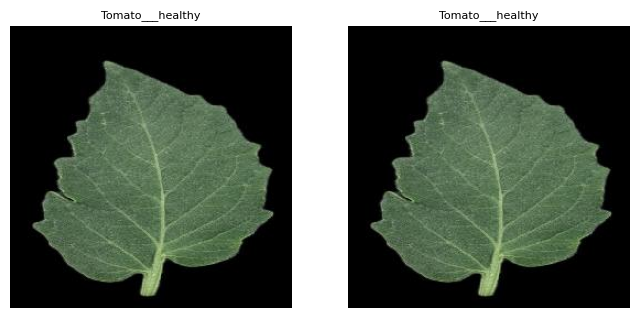


Hash: 81bbc3099cd82dc17025ffa3f73c2fca - 2 imágenes duplicadas idénticas


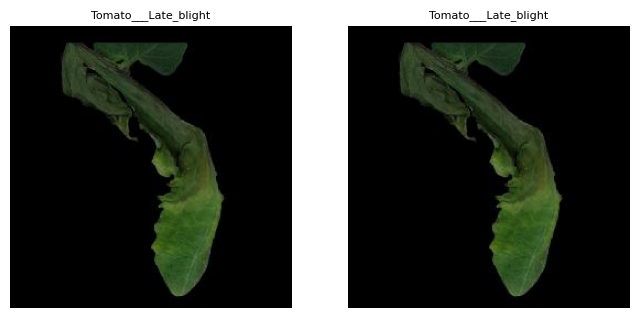


Hash: 8bbefab9461168ef9946618480d2f0ad - 2 imágenes duplicadas idénticas


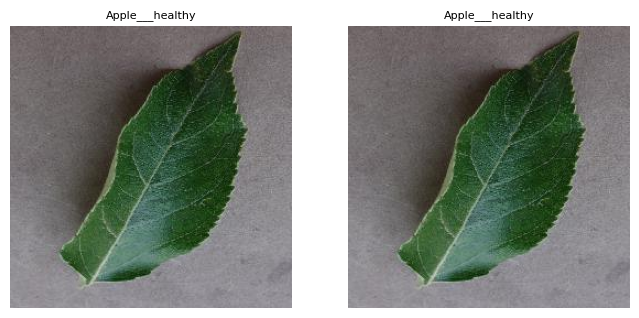


Hash: 8c414bb380ee3405996a84b11794d53a - 2 imágenes duplicadas idénticas


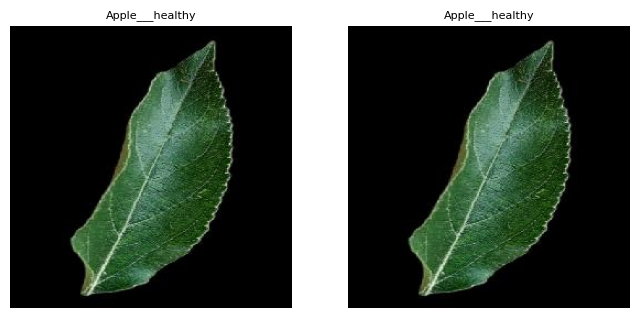


Hash: 925964dcab342a41290bc3bcbcee4a4b - 2 imágenes duplicadas idénticas


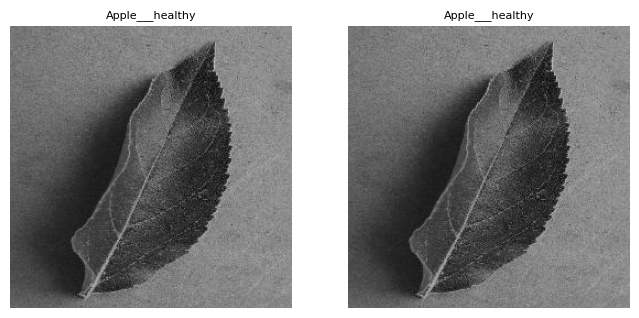


Hash: 926f8ebcfc60d44649018c5154c8fcec - 2 imágenes duplicadas idénticas


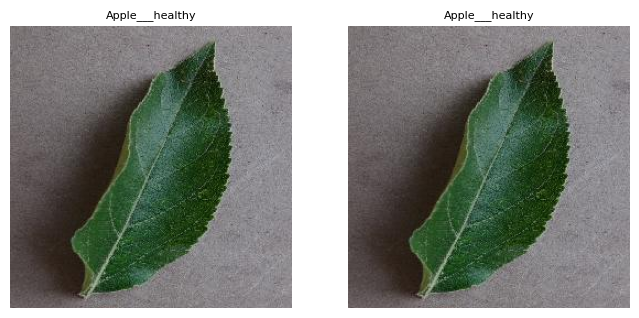


Hash: 94dfcc168050b176b2a87e9266e606b0 - 2 imágenes duplicadas idénticas


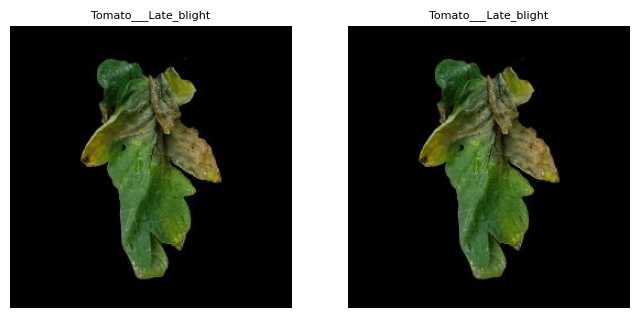


Hash: a94c45a5a11747b1e77319843d0f225a - 2 imágenes duplicadas idénticas


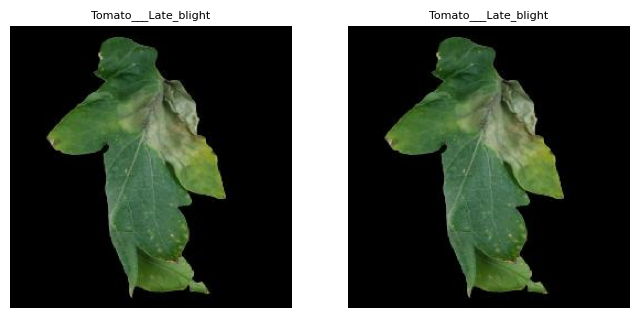


Hash: ac536225a4996e927bd5c42b4407d92c - 2 imágenes duplicadas idénticas


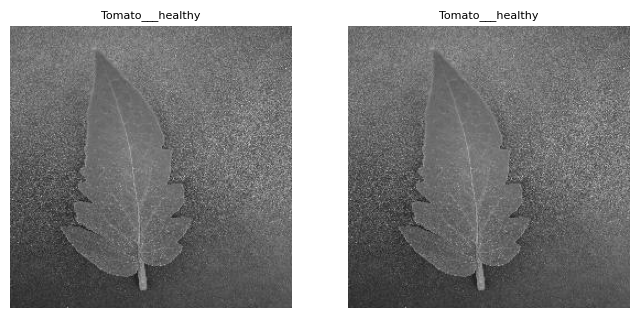


Hash: ae0e96048f04b1a04dbc487d7e057a39 - 2 imágenes duplicadas idénticas


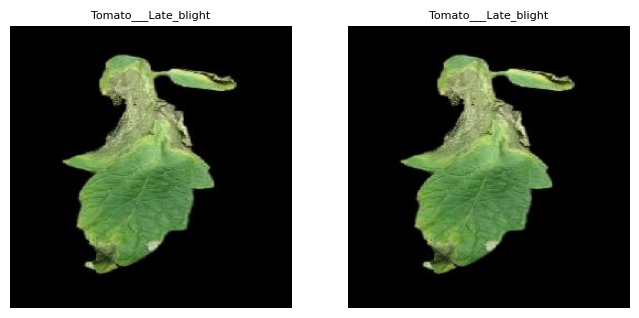


Hash: b4b8d92a066e35350442d21ee87c850c - 2 imágenes duplicadas idénticas


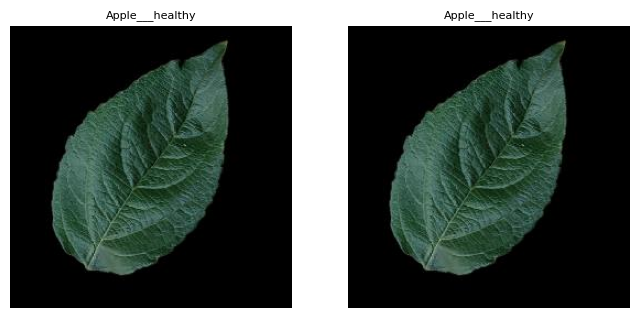


Hash: b52b4f431c91e7f433c91cd1a9390a7b - 2 imágenes duplicadas idénticas


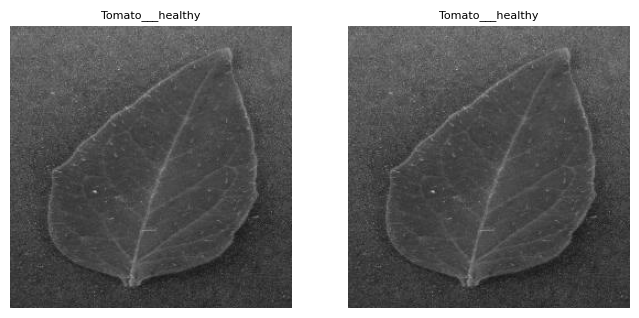


Hash: b963c3061120e2e22123280a34b835d9 - 2 imágenes duplicadas idénticas


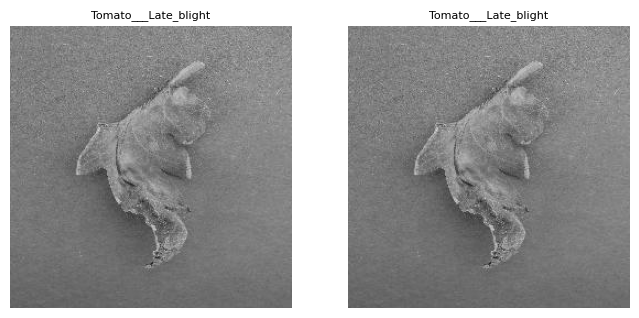


Hash: bf12be065849d781b7da2e79091b1072 - 2 imágenes duplicadas idénticas


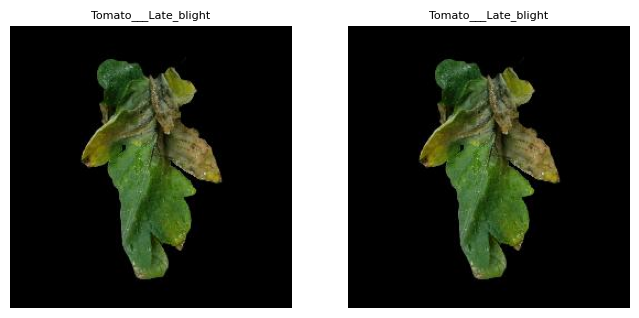


Hash: c1b24c8caaa06e756560a83d7358579e - 2 imágenes duplicadas idénticas


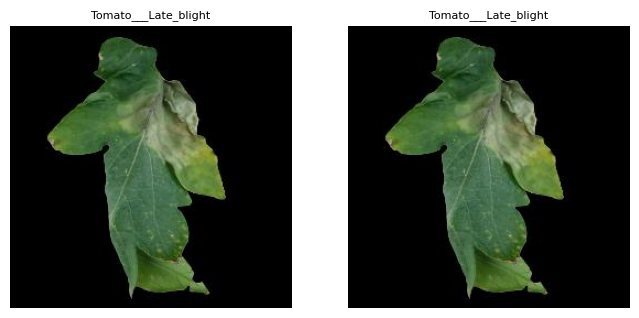


Hash: c42e0ad10d2a4b4e6a9e19e026f5977e - 2 imágenes duplicadas idénticas


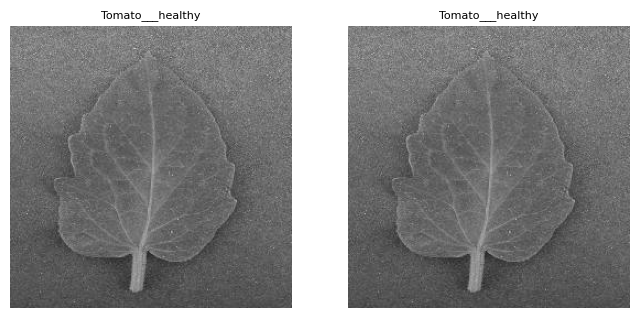


Hash: ca06650efa30a3f6731df694f07b4690 - 2 imágenes duplicadas idénticas


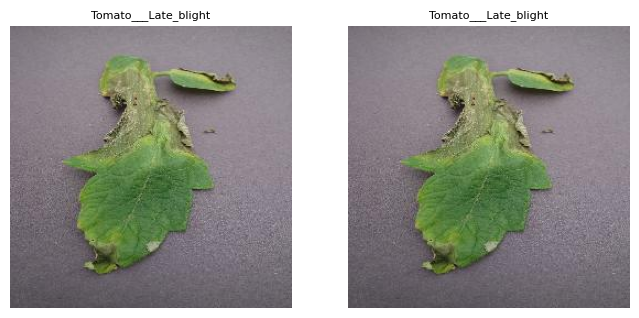


Hash: cacfb8650025ab44b08840709dfcfc56 - 2 imágenes duplicadas idénticas


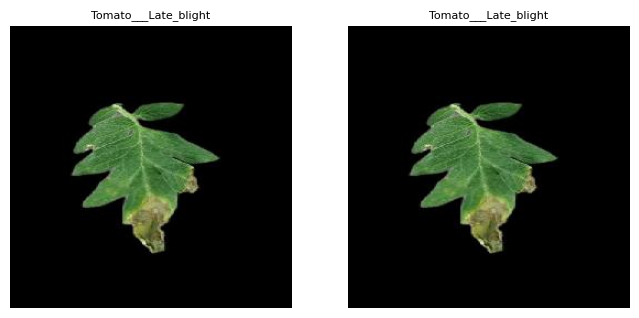


Hash: d4fb16238fad095c02551a443a8dc353 - 2 imágenes duplicadas idénticas


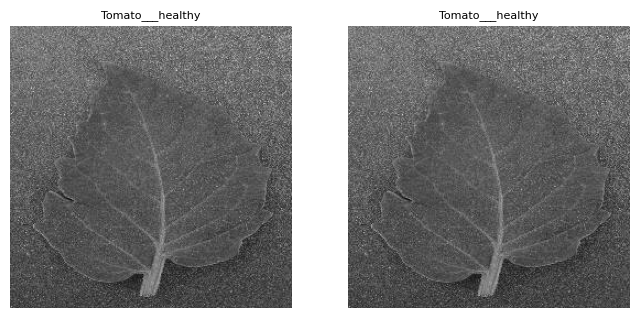


Hash: df43ae454d93896bd5b7b0bf272c17ef - 2 imágenes duplicadas idénticas


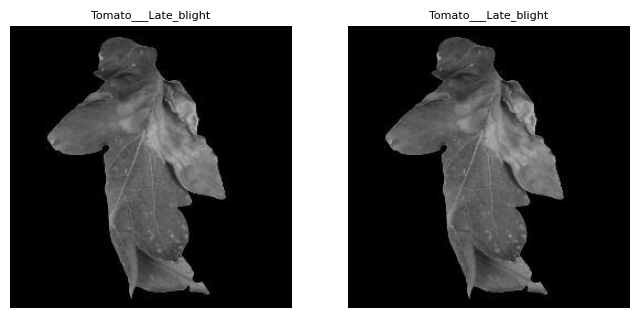


Hash: e40cd35463d81c4c4b71947d0a7aa9c6 - 2 imágenes duplicadas idénticas


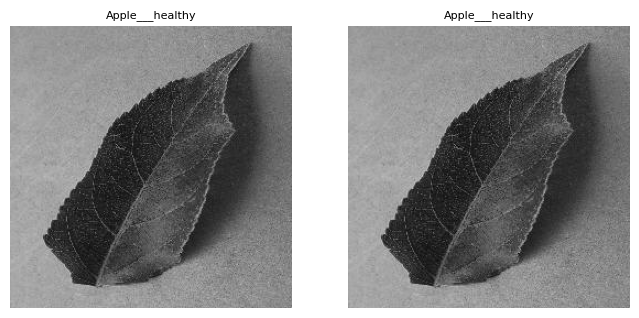


Hash: ea0a44df2e4e44c6ccacc31f067a6284 - 2 imágenes duplicadas idénticas


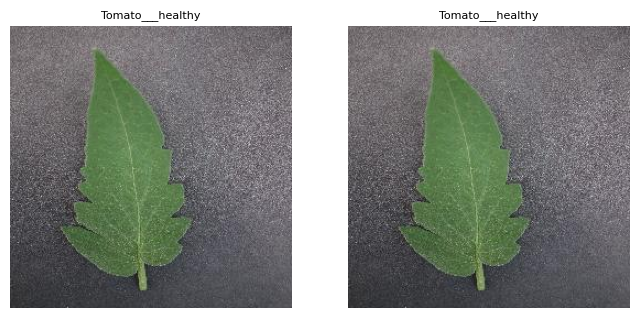


Hash: eb6224e4d54fe435a3a48aa8b2c662d4 - 2 imágenes duplicadas idénticas


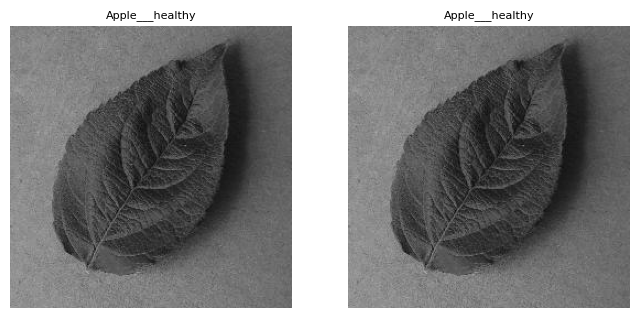


Hash: f5aeed274f445bd56e29e307b60c787e - 2 imágenes duplicadas idénticas


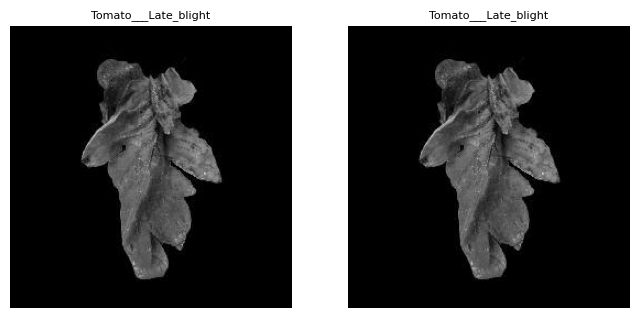


Hash: f7cfc857e8481fbcd16e5a8617c9b3ed - 2 imágenes duplicadas idénticas


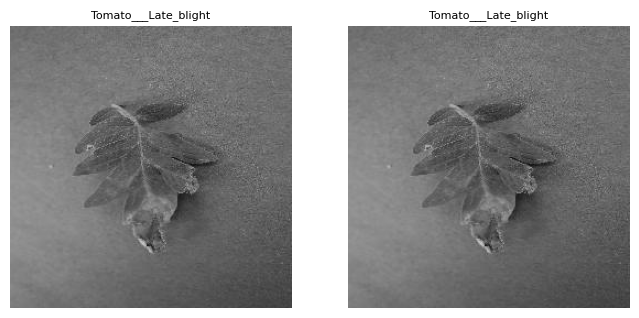


Hash: fb72d1f9dbd2af9a9ee3fc3421ecf6a4 - 2 imágenes duplicadas idénticas


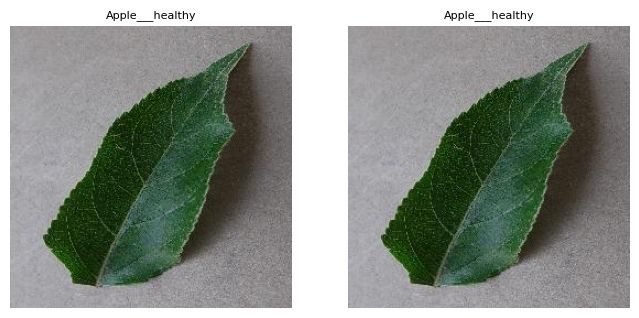


Hash: fc58a128685fb832a95a106b9c60a007 - 2 imágenes duplicadas idénticas


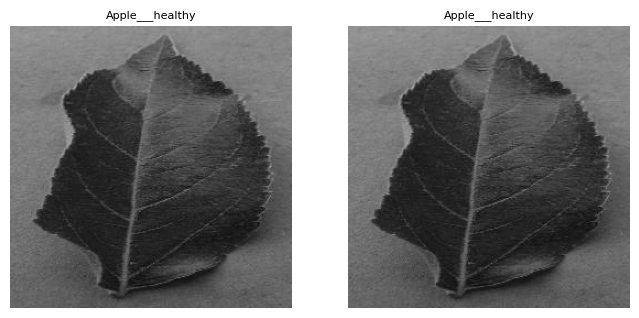


Hash: fca1269da354adeff87d5c76d5856d4a - 2 imágenes duplicadas idénticas


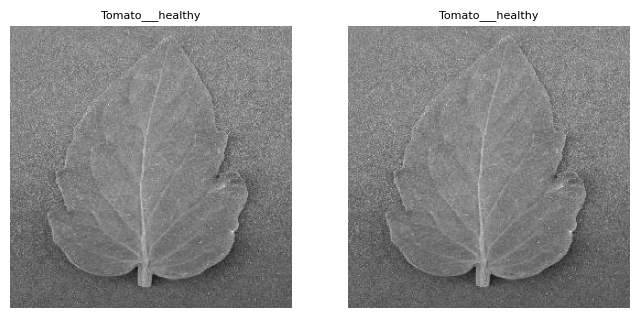

In [ ]:
df_hash = df.copy()

# Función para calcular hash de cada imagen
def file_hash(path):
    try:
        with open(path, 'rb') as f:
            return hashlib.md5(f.read()).hexdigest()
    except:
        return None

# Columna temporal de hashes
df_hash['hash'] = df_hash['path'].apply(file_hash)

# Encontramos duplicados exactos
duplicates = df_hash[df_hash.duplicated('hash', keep=False)]

# Contamos grupos y total de imágenes duplicadas
num_grupos = duplicates['hash'].nunique()
num_imagenes_duplicadas = duplicates.shape[0]

print(f"Hay {num_grupos} grupos de duplicados")
print(f"Número total de imágenes duplicadas: {num_imagenes_duplicadas}")

# Agrupos duplicados por hash
duplicates_groups = duplicates.groupby('hash')

# Mostramos cada grupo de duplicados
for h, group in duplicates_groups:
    n = len(group)
    print(f"\nHash: {h} - {n} imágenes duplicadas idénticas")

    fig, axes = plt.subplots(1, n, figsize=(4 * n, 4))
    if n == 1:
        axes = [axes]

    for ax, (_, row) in zip(axes, group.iterrows()):
        img = Image.open(row['path'])
        ax.imshow(img)
        ax.set_title(f"{row['label']}", fontsize=8)
        ax.axis('off')

    plt.show()


Existen 63 grupos de imágenes duplicadas.